# Analysis of data on rainfall and fires in Australia

Tinkering with the data from: 

https://github.com/rfordatascience/tidytuesday/blob/master/data/2020/2020-01-07/readme.md

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import sys
import os
import glob
from osgeo import gdal
import scipy.ndimage
import datetime as dt

%matplotlib inline

In [2]:
import configparser
config = configparser.ConfigParser()
config.read('config.ini')
mapbox_token = config['mapbox']['token']

In [3]:
#import data files 

rainfall = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-07/rainfall.csv',
                      parse_dates={'date': ['year','month','day']},index_col='date')
temp = pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-07/temperature.csv",
                  parse_dates=["date"],index_col="date")
fires = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-07/MODIS_C6_Australia_and_New_Zealand_7d.csv',
                   parse_dates = {'date':['acq_date']},index_col='date')

### Define functions for processing

In [4]:
def clean_df(df):
    
    for col in df.columns: 
        if type(df[col][0]) == str:
            df[col] = df[col].apply(lambda x:x.lower())
            
    return df


def NaN_perc(df):
    return 100*df.isna().sum()/df.shape[0]

### Prepare dataframes

In [5]:
rainfall = clean_df(rainfall)

In [6]:
rainfall["city_name"].unique()

array(['perth', 'adelaide', 'brisbane', 'sydney', 'canberra', 'melbourne'],
      dtype=object)

In [7]:
rainfall.columns

Index(['station_code', 'city_name', 'rainfall', 'period', 'quality', 'lat',
       'long', 'station_name'],
      dtype='object')

In [8]:
rainfall = rainfall.drop(["station_code","period","station_name","quality"],axis=1)

In [9]:
NaN_perc(rainfall)

city_name    0.000000
rainfall     6.559828
lat          0.000000
long         0.000000
dtype: float64

In [10]:
rainfall.dropna(inplace=True)

In [11]:
temp = clean_df(temp)

In [12]:
temp ["city_name" ] = temp["city_name"].replace(to_replace="port", value="adelaide")

In [13]:
temp = temp[temp["city_name"]!="kent"]

In [14]:
temp["city_name"].unique()

array(['perth', 'adelaide', 'brisbane', 'sydney', 'canberra', 'melbourne'],
      dtype=object)

In [15]:
temp.dropna(inplace=True)

In [16]:
temp = temp[temp["temp_type"]=="max"]
temp = temp.drop(["site_name","temp_type"],axis=1)

In [17]:
rainAndtemp = pd.merge(left = rainfall.reset_index(),
                       right = temp.reset_index(),
                      left_on = ["date","city_name"],
                      right_on = ["date","city_name"])

In [18]:
rainAndtemp = rainAndtemp.set_index(["date","city_name"])
rainAndtemp.sort_index(inplace=True)

### Brief EDA

In [19]:
rainAndtemp.head()

rainfall    lat    long  temperature
date       city_name                                      
1910-01-02 adelaide        0.0 -34.92  138.60         38.7
           sydney          0.0 -33.86  151.21         25.3
1910-01-03 adelaide        0.0 -34.92  138.60         37.6
           sydney          0.0 -33.86  151.21         31.0
1910-01-04 adelaide        0.0 -34.92  138.60         32.4

In [20]:
cities = list(rainAndtemp.index.get_level_values(level=1).unique())

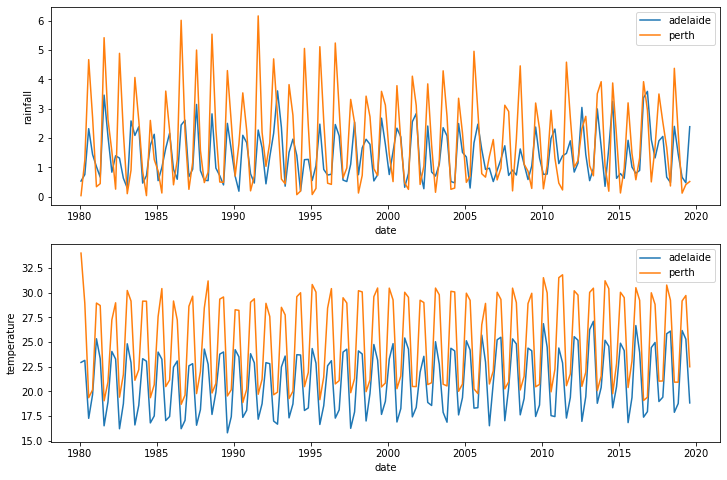

In [21]:
# Plot of rainfall and temperature for adelaide and perth

# cities = list(rainAndtemp.index.get_level_values(level=1).unique())
cities = ["adelaide","perth"]

fig,axes = plt.subplots(2,1,figsize=(12,8))
labels = []

for city in cities:
    
    data = rainAndtemp.loc["01-01-1980":"31-05-2019"].xs(city,level=1).resample("3M").mean()
    sns.lineplot(x=data.index, y="rainfall",data=data,ax=axes[0]);
    sns.lineplot(x=data.index, y="temperature",data=data,ax=axes[1]);
    labels.append(city)
    
axes[0].legend(labels)
axes[1].legend(labels)

### Create animated map of fires

In [22]:
# Simple sequence of maps

mapfire = fires.reset_index()

fig = px.scatter_mapbox(fires,lat="latitude",lon="longitude",color="brightness",
                        hover_data = ["brightness"],color_continuous_scale="YlOrRd_r",
                        animation_frame=fires.index.strftime("%Y-%m-%d"),
                        zoom=2.5,center={"lat":-24.8,"lon":135})

fig.update_layout(mapbox_style="dark",mapbox_accesstoken=mapbox_token,
                 margin=({"r":0,"t":0,"l":0,"b":0}),
                 )
fig.update_traces(marker=dict(
                    size=8,opacity=0.3))

fig.show()

### Work on further customization - single image

In [23]:
fires["size"] = fires["brightness"].apply(lambda x:10*((x-fires["brightness"].min()+1)/(fires["brightness"].max()-fires["brightness"].min())))
fires["color"] = fires["brightness"].apply(lambda x:((x-fires["brightness"].min()+1)/(fires["brightness"].max()-fires["brightness"].min())))

In [24]:
day = "2020-01-01"
test = fires.loc[day]

fig = go.Figure(
    go.Scattermapbox(
        lat=test["latitude"],
        lon=test["longitude"],
        mode="markers",
        marker=go.scattermapbox.Marker(
            size=test["size"],
            color = "lightgoldenrodyellow",

        )
    )
)

customdata = test["brightness"]

hovertemplate= """
<extra></extra>
<em>Fire Brightness</em><br>
\U0001F525: %{customdata}
"""

fig.update_layout(
    mapbox = dict(
        style ="dark",
        accesstoken=mapbox_token,
        center=go.layout.mapbox.Center(lat=-25,lon=134.149),
        zoom=2.5), 
    margin = dict(l=0,r=0,t=0,b=0),
    hoverlabel = dict(align="left",font=dict(size=15))
)

fig.update_traces(
    customdata = customdata,
    hovertemplate=hovertemplate)


fig.show()


### Work on further customization - animation

In [25]:
days = fires.index.unique().strftime("%Y-%m-%d").tolist()

In [26]:
play_button = [{
    "type":"buttons",
    "buttons":[{
        "label":"Play",
        "method":"animate",
        "args":[
            None,
            {
                "frame":{"duration":1000,"redraw":True},
                "transition":{"duration":50,"easing":"quadratic-in-out"},
                "fromcurrent":True,
                "mode":"immediate",
            }
        ]},
  
    ],
    "showactive":True,
}]

In [27]:
frames = [go.Frame(
    name= "Day: {}".format(day),
    data = [{
        "type":"scattermapbox",
        "lat":fires.xs(day)["latitude"],
        "lon":fires.xs(day)["longitude"],
        "marker": go.scattermapbox.Marker(
            size=fires.xs(day)["size"],
            color="lightgoldenrodyellow",
        ),
        "customdata": fires.xs(day)["brightness"],
        "hovertemplate": "<extra></extra><em>Fire Brightness</em><br>\U0001F525: %{customdata}"
    }],
    layout = go.Layout(
                annotations = [
                    go.layout.Annotation(
                    text="{}".format(day),
                    )
                ])
    )
         for day in days]

In [28]:
layout = go.Layout(
    margin = {"t":0,"l":0,"b":0,"r":0},
    updatemenus=play_button,
    mapbox={
        "accesstoken":mapbox_token,
        "center":{"lat":-33,"lon":150},
        "zoom":4.5,
        "style":"dark"},
    annotations = [
                    go.layout.Annotation(
                    font={"family":"Arial","size":30,"color":"white"},
                    x = 0.75,
                    xref = "paper",
                    xanchor = "left",
                    y = 0.9,
                    yref = "paper",
                    yanchor = "top",
                    bordercolor = "white",
                    borderpad = 5,
                    borderwidth = 2,
                    showarrow = False,
                    text="{}".format(days[0]),
                    )
                ]
    )

In [29]:
sliders = [{
    "active":0,
    "yanchor":"top",
    "xanchor":"left",
    "transition":{"duration":50},
    "x":0.1,
    "y":0,
    "len":0.8,
    "pad":{"b":10,"t":50},
    "currentvalue":{"font":{"size":15},"visible":True},
    "steps":[
        {
            "label":day,
            "method":"animate",
            "args":[
                ["Day: {}".format(day)],
                {"mode":"immediate","frame":{"duration":1000, "redraw":True},
                "transition":{"duration":50,"easing":"cubic-in-out"}}
            ],
        } for day in days]
}]

In [30]:
data = frames[0]["data"]
# title = frames[0]["name"]

fig = go.Figure(data=data,layout=layout,frames=frames)

fig.show()

## I created a query to the NASA AppEEARS server for additional satellite images

Data from MODIS Land Surface Temperature and Emissivity
https://modis.gsfc.nasa.gov/data/dataprod/mod11.php

I need to further explore how the data is stored and using which format and units

### Testing how to plot one image

In [31]:
Folder = os.getcwd()
TIFFolder = "Emis"
CompFolder = os.path.join(Folder,TIFFolder)

filenames = [os.path.join(CompFolder,f) for f in os.listdir(CompFolder) if f.endswith(".tif")]
filenames = filenames[-30:-24]
pic = gdal.Open(filenames[0])

picBand = pic.GetRasterBand(1)
picData = picBand.ReadAsArray().astype('float')

# extract metadata

file = filenames[0].split("\\")[-1].split(".tif")[0]
productID = file.split('_')[0]
layerID = file.split(productID + '_')[1].split('_doy')[0]
yeardoy = file.split(layerID + '_doy')[1].split('_aid')[0]
aid = file.split(yeardoy + '_')[1].split('.tif')[0]
date = dt.datetime.strptime(yeardoy, '%Y%j').strftime("%d/%m/%Y")
print("Product Name: {}\nLayer Name: {}\nDate of Observation: {}".format(productID,layerID,date))

Product Name: MYD11A2.006
Layer Name: QC_Night
Date of Observation: 19/12/2019


In [32]:
# File Metadata

pic_meta = pic.GetMetadata()
rows, cols = pic.RasterYSize,pic.RasterXSize

# Projection Information

geotrasform = pic.GetGeoTransform()
proj = pic.GetProjection()

# Band metadata
picFill = picBand.GetNoDataValue()
picStats = picBand.GetStatistics(True,True)
pic = None

print("Min pic: {}\nMax pic: {}\nMean pic: {}\nSD pic: {}".format(picStats[0],picStats[1],picStats[2],picStats[3]))

Min pic: 2.0
Max pic: 145.0
Mean pic: 10.744694132335
SD pic: 19.466403186977


In [33]:
scaleFactor = float(pic_meta['scale_factor'])
units = pic_meta['units']              

print("Scale Factor: {}\nData Units: {}".format(scaleFactor,units)) # Need to better understand what the units are

Scale Factor: 1.0
Data Units: Bit Field


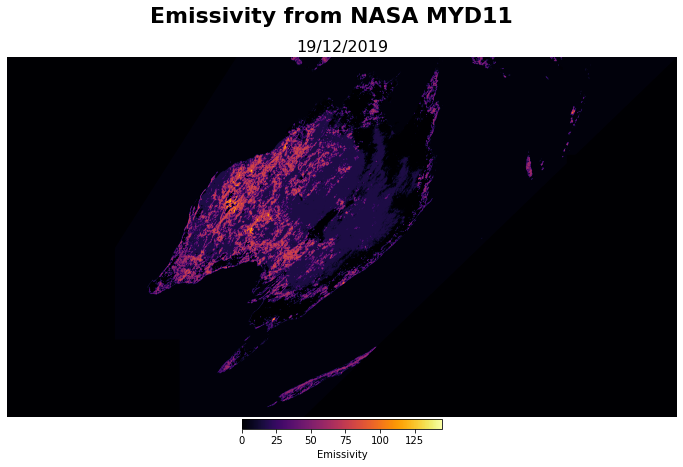

In [34]:
fig,ax = plt.subplots(figsize=(12,7))
plt.axis("off")
fig.suptitle("Emissivity from NASA MYD11",fontsize = 22, fontweight = "bold")
ax.set_title("{}".format(date),fontsize = 16)
im = ax.imshow(picData,vmin=np.nanmin(picData),vmax=np.nanmax(picData), cmap="inferno",aspect="auto",extent=ax.axis());

plt.colorbar(im, orientation="horizontal", shrink = 0.3, fraction = 0.05, pad = 0.005, label = "Emissivity");

### Plotting multiple days

In [35]:
date = list([date])
EmiData = picData[np.newaxis,:,:]

In [36]:
for i in range(1,len(filenames)):
    Emi = gdal.Open(filenames[i])
    Emib = Emi.GetRasterBand(1).ReadAsArray().astype("float")
    Emib = Emib[np.newaxis,:,:]
    EmiData = np.append(EmiData,Emib,axis=0)
    del Emib
    Emi = None
    yeardoy = filenames[i].split(layerID + "_doy")[1].split("_aid")[0]
    date.append(dt.datetime.strptime(yeardoy,'%Y%j').strftime('%d/%m/%Y'))

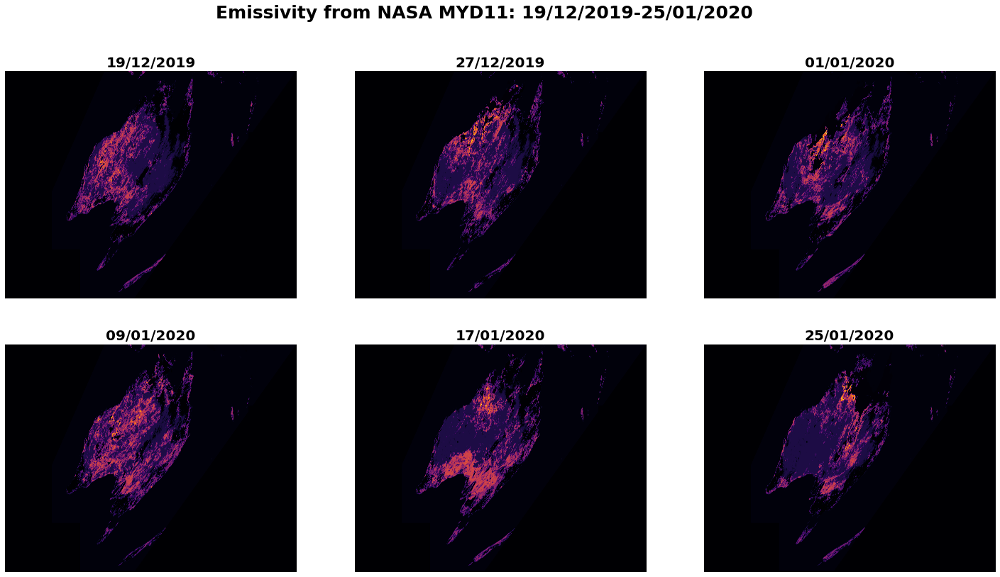

In [37]:
fig, axes = plt.subplots(2,3,figsize=(25,13),sharey=True,sharex=True)

fig.suptitle("Emissivity from NASA MYD11: {}-{}".format(date[0],date[-1]),fontsize = 25, fontweight = "bold")

for i in range(len(filenames)):
    
    axes[int(i/3)][i-3*int(i/3)].set_title(date[i],fontsize=20,fontweight="bold")
    axes[int(i/3)][i-3*int(i/3)].axis("off")
    axes[int(i/3)][i-3*int(i/3)].imshow(EmiData[i],vmin=np.nanmin(EmiData[0]),vmax=np.nanmax(EmiData[0]), cmap="inferno",
                                            aspect="auto",extent=axes[int(i/3)][i-3*int(i/3)].axis())